## Final Project (DATA 620) 
## Topic: Foursquare NYC restaurants
#### Authors: John Mazon, LeTicia Cancel, Bharani Nitalla

Video: 

references 
https://www.kaggle.com/chenxidong/stack-overflow-tag-networkx-visualization 

https://lobeslab.com/analysis-of-restaurant-reviews/

In [27]:
#loading libraries
import pandas as pd
import os
import requests
import zipfile
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import scipy
from networkx.algorithms import bipartite

# Downloading and Extracting Datasets

Two bipartite networks of users and restaurant locations in New York City on Foursquare, from 24 October 2011 to 20 February 2012. In one network, an edge denotes a check-in event of a user at a restaurant. In the other, an edge exists if a user left a tip/comment on a restaurant. Metadata include comments.

## Downloading and Extracting the Dataset

In [3]:
checkin_network = pd.read_csv("https://raw.githubusercontent.com/ltcancel/DATA620/main/Final%20Project/dataset_ubicomp2013/dataset_ubicomp2013_checkins.txt", sep="\t", header=None)
tips_network = pd.read_csv("https://raw.githubusercontent.com/ltcancel/DATA620/main/Final%20Project/dataset_ubicomp2013/dataset_ubicomp2013_tips.txt", sep="\t", header=None, encoding='ISO-8859-1')

In [4]:
checkin_network.columns = ['userID', 'venueID']
checkin_network.head()

,userID,venueID
0,35443,899
1,24973,42406
2,14860,177
3,222505,177
4,63524,609


In [5]:
tips_network.columns = ['userID','venueID','tipText']
tips_network.head()

,userID,venueID,tipText
0,24436,15,make your own sandwich: tuna salad on country ...
1,8550,20,The calamari as an appetizer and the quail. Pr...
2,1537,20,Be careful with the napkins on your pants. The...
3,59283,20,"try the steak frites, it's the best - believe me"
4,713,20,go visit google across the street. see the big...


# Creating the Graph

In [6]:
B = nx.Graph()

In [58]:
records = tips_network[['userID','venueID']]
records = records.to_records(index=False)
tips_tuple = list(records)
tips_tuple[:10]

[(24436, 15),
 (8550, 20),
 (1537, 20),
 (59283, 20),
 (713, 20),
 (40518, 20),
 (33560, 20),
 (17435, 20),
 (59010, 20),
 (59010, 20)]

In [42]:
B.add_nodes_from(checkin_network, bipartite='userID')
B.add_nodes_from(checkin_network, bipartite='venueID')

count = 0
for index, edge in tips_network.iterrows():
    source, dest = int(edge["userID"]), int(edge["venueID"])
    
    B.add_edge(source,dest)
    count +=1
    if count == 1500:
        break

In [44]:
print("Number of nodes in tips network:", B.number_of_nodes())
print("Number of edges in tips network:", B.number_of_edges())

Number of nodes in tips network: 6318
Number of edges in tips network: 10624


# Graph Plots

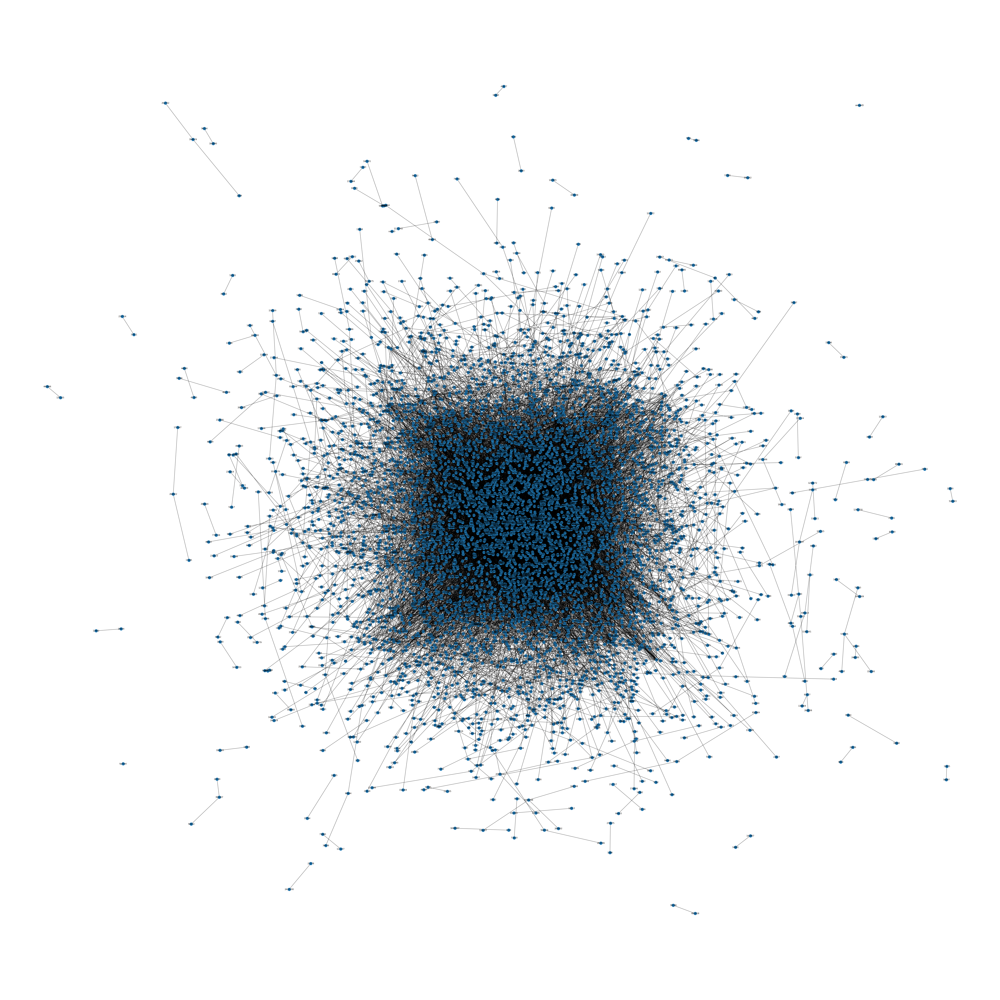

In [56]:
fig = plt.figure(figsize=(80, 80)) 
# nx.draw(checkin_network_graph, with_labels=True)
nx.draw(B, pos=nx.spring_layout(B, iterations=5), with_labels=True)
# nx.draw(checkin_network_graph, node_size=10)

plt.axis('equal') 
plt.show()

# Conclusion

In [59]:
S = [B.subgraph(c).copy() for c in nx.connected_components(B)]
len(S)

294

In [62]:
S

Old code

In [ ]:
## tips network
# load edges
G = nx.from_pandas_edgelist(checkin_network, 'userID','venueID')
nx.draw(G, with_labels=True)

plt.show()

In [ ]:
nx.draw(B, with_labels=True)
plt.show()

In [ ]:
fig = plt.figure(figsize=(70, 70)) 

# nx.draw(tips_network, with_labels=True)
# nx.draw(tips_network, pos=nx.spring_layout(tips_network), node_size=10)
nx.draw(B, node_size=10)
plt.axis('equal') 
plt.show()

# Citation

D. Yang, et al. "Fine-grained preference-aware location search leveraging crowdsourced digital footprints from LBSNs." Proceedings of the 2013 ACM international joint conference on Pervasive and ubiquitous computing. ACM. (2013).